# Анализ рынка общественного питания в Москве

## Заказчик:

Инвестор из фонда «Shut Up and Take My Money», который решил открыть заведение общественного питания в Москве

## Цели проекта:

1. Провести анализ рынка общественного питания
2. Найти интересные особенности и презентовать полученные результаты
3. Как результат - помочь инвесторам выбрать подходящее место для открытия заведения

## Входные данные:

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
        - «Средний счёт: 1000–1500 ₽»;
        - «Цена чашки капучино: 130–220 ₽»;
        - «Цена бокала пива: 400–600 ₽».
        - и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
        - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
        - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
        - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
        - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
        - 0 — заведение не является сетевым
        - 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Ход исследования:

- Выгрузка и предобработка данных
- Анализ данных
- Детализация исследования
- Подготовка презентации
- Вывод

# Выгрузка и предобработка данных

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import json
from folium import Map, Choropleth
from folium import Marker, Map
from folium.plugins import MarkerCluster
import warnings; warnings.filterwarnings(action = 'ignore') 
from scipy import stats as st
import plotly.express as px
from plotly import graph_objects as go
from IPython.display import set_matplotlib_formats
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

In [2]:
# снимаем ограничение на количество столбцов
pd.set_option('display.max_columns', None)

# игнорируем предупреждения
pd.set_option('chained_assignment', None) 

In [3]:
data = pd.read_csv('/datasets/moscow_places.csv', sep=',')

In [4]:
data.info()
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
data['name'].describe()

count     8406
unique    5614
top       Кафе
freq       189
Name: name, dtype: object

Видим, что типы данных и начименования столбцов в таблице корректные.

Также видим, что в столбцах с информацией о времени работы, категории цен, средних чеках и количестве посадочных мест имеются пропуски.
В данном случае заполнение данной информации может привести к искажению данных, оставим так, как есть.

Проверим таблицу на явные и неявные дубликаты в столбцах с категориальным типом данных.

In [6]:
data.duplicated().sum()

0

In [7]:
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [8]:
data['category'].describe()

count     8406
unique       8
top       кафе
freq      2378
Name: category, dtype: object

In [9]:
data['price'].unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [10]:
data['price'].describe()

count        3315
unique          4
top       средние
freq         2117
Name: price, dtype: object

In [11]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [12]:
data['district'].describe()

count                                   8406
unique                                     9
top       Центральный административный округ
freq                                    2242
Name: district, dtype: object

In [13]:
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Неявные дубликаты в колонках с категорией заведений, цен и округов отсутствуют.

Попробуем выявить дубликаты среди заведений.
Приведем наименования заведений к единому регистру и удалим лишние пробелы в конце. 

In [14]:
data['name'] = data['name'].str.lower()
data['name'] = data['name'].str.strip()

Проверим дубли по наименованию заведений (не сетевых)

In [15]:
duplicate = data[data.duplicated(['name'])].query('chain == 0')
duplicate.sample(50)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
7752,кафе,кафе,"Москва, Варшавское шоссе, 170Г",Южный административный округ,NaN,55.580400,37.590381,4.2,NaN,NaN,NaN,NaN,0,100.0
598,кафе-столовая,кафе,"Москва, Старопетровский проезд, 7А, стр. 25",Северный административный округ,NaN,55.825661,37.500781,3.9,NaN,NaN,NaN,NaN,0,NaN
7566,кафе,кафе,"Москва, Егорьевский проезд, 2А, стр. 14",Юго-Восточный административный округ,NaN,55.674007,37.735153,4.5,NaN,NaN,NaN,NaN,0,NaN
7260,бистро,булочная,"Москва, Ереванская улица, 28, корп. 1",Южный административный округ,"ежедневно, круглосуточно",55.627945,37.678431,4.1,NaN,NaN,NaN,NaN,0,240.0
2549,кафе,быстрое питание,"Москва, улица Бориса Галушкина, 18",Северо-Восточный административный округ,NaN,55.822165,37.655968,4.8,NaN,NaN,NaN,NaN,0,15.0
5711,столовая,столовая,"Москва, проспект Вернадского, 12Д",Западный административный округ,"ежедневно, 08:00–01:00",55.686030,37.511410,4.8,средние,Средний счёт:от 250 ₽,250.0,NaN,0,30.0
5586,буфет,кафе,"Москва, улица Коновалова, 5А",Юго-Восточный административный округ,NaN,55.729736,37.761650,3.5,NaN,NaN,NaN,NaN,0,NaN
5847,кафе,кафе,"Москва, Рябиновая улица, вл20соор1",Западный административный округ,NaN,55.704006,37.419210,4.3,NaN,NaN,NaN,NaN,0,NaN
6884,рэдимэйд,ресторан,"Москва, Профсоюзная улица, 25А",Юго-Западный административный округ,"ежедневно, 09:00–22:00",55.674186,37.565740,4.4,средние,Средний счёт:500–1000 ₽,750.0,NaN,0,40.0
527,ресторан,ресторан,"Москва, Планерная улица, 12",Северо-Западный административный округ,NaN,55.860520,37.437190,4.4,NaN,NaN,NaN,NaN,0,145.0


Большая часть дублей - это заведения с распространенным типовым наименованием, которое больше похоже на категорию (кафе, ресторан, столовая, шаурма).

В связи с этим предлагаем не удалять данные дубли, оставить, как есть.

Добавим в таблицу столбцы с улицей и обозначением, что заведение работает круглосуточно

In [16]:
def get_street(s):
    return s.split(', ', maxsplit=2)[1]

In [17]:
data['street'] = data['address'].apply(get_street)

In [18]:
data['hours'] = data['hours'].fillna(value='') 

In [19]:
def categorize_purpose(row):
    if 'ежедневно' in row and 'круглосуточно' in row:
        return True
    else:
        return False

In [20]:
data['is_24/7'] = data['hours'].apply(categorize_purpose)

In [21]:
data.sample(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1259,андерсон,кафе,"Москва, улица Маршала Бирюзова, 32",Северо-Западный административный округ,"пн-пт 08:30–22:00; сб,вс 10:00–22:00",55.799348,37.482991,4.3,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,174.0,улица Маршала Бирюзова,False
2029,naturality,кафе,"Москва, Красноармейская улица, 11к2",Северный административный округ,"ежедневно, 10:00–23:00",55.799682,37.543861,4.0,средние,Средний счёт:600 ₽,600.0,NaN,1,NaN,Красноармейская улица,False
120,два бобра,быстрое питание,"Москва, улица Пришвина, 12, корп. 2",Северо-Восточный административный округ,пн-пт 09:00–16:00,55.887643,37.597431,4.1,NaN,NaN,NaN,NaN,0,44.0,улица Пришвина,False
2841,чайхана döner,кафе,"Москва, Измайловский проспект, 61с2",Восточный административный округ,"ежедневно, круглосуточно",55.788610,37.783970,4.0,NaN,NaN,NaN,NaN,0,NaN,Измайловский проспект,True
7841,магбургер,быстрое питание,"Москва, улица Подольских Курсантов, 7А",Южный административный округ,"ежедневно, круглосуточно",55.608364,37.622232,4.2,NaN,Средний счёт:390–460 ₽,425.0,NaN,1,10.0,улица Подольских Курсантов,True
7023,the wild bean cafe,кафе,"Москва, Профсоюзная улица, 84Ас1",Юго-Западный административный округ,"ежедневно, круглосуточно",55.654886,37.536662,3.5,NaN,NaN,NaN,NaN,1,NaN,Профсоюзная улица,True
4129,navat,ресторан,"Москва, улица Новый Арбат, 15",Центральный административный округ,"пн-чт 11:00–00:00; пт,сб 11:00–02:00; вс 11:00...",55.752170,37.591829,4.4,выше среднего,Средний счёт:от 1200 ₽,1200.0,NaN,1,250.0,улица Новый Арбат,False
7249,чайхана,кафе,"Москва, Каширское шоссе, 7, корп. 1",Южный административный округ,,55.669340,37.628945,4.2,NaN,Средний счёт:250–400 ₽,325.0,NaN,1,350.0,Каширское шоссе,False
4654,хинкальная,"бар,паб","Москва, улица Покровка, 16",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–03:00; вс 12:00...",55.758642,37.645889,4.5,NaN,NaN,NaN,NaN,1,90.0,улица Покровка,False
1979,лахинкали,ресторан,"Москва, Планетная улица, 45",Северный административный округ,"ежедневно, 11:00–00:00",55.805571,37.539494,4.3,NaN,NaN,NaN,NaN,0,NaN,Планетная улица,False


# Вывод

На данном этапе мы ознакомились с данными, проверили пропуски и дубликаты, также добавили столбцы с улицей, на которой находится заведение, и признаком круглосуточной работы.

При обзоре данных выявили, что большая часть заведений из списка находятся в центральном округе Москвы, относятся к категории кафе и имеют средние цены. Также видим, что по количеству посадосных мест представлены различные заведения: от 0 до более чем 1000 мест.

# Анализ данных

Рассмотрим, какие категории заведений представлены в данных

In [22]:
data_categories = data.pivot_table(index='category', values='name', aggfunc='count', margins=True).sort_values(by='name', ascending=False).reset_index()
data_categories = data_categories.rename(columns={'name': 'count'})
data_categories['share'] = round(data_categories['count']/data_categories['count'][0]*100, 1)
data_categories = data_categories.query('share < 100')
data_categories

,category,count,share
1,кафе,2378,28.3
2,ресторан,2043,24.3
3,кофейня,1413,16.8
4,"бар,паб",765,9.1
5,пиццерия,633,7.5
6,быстрое питание,603,7.2
7,столовая,315,3.7
8,булочная,256,3.0


In [23]:
category = ['кафе', 'ресторан', 'кофейня', 'бар,паб', 'пиццерия', 'быстрое питание', 'столовая', 'булочная']
values = [28.3, 24.3, 16.8, 9.1, 7.5, 7.2, 3.7, 3.0]

fig = go.Figure(data=[go.Pie(labels=category, values=values, pull = [0.1, 0])])
fig.update_layout(title='Доля заведений в Москве в разрезе категорий',
                  width=800,
                  height=600,
                  annotations=[dict(x=1.12,
                                    y=1.05,
                                    text='Категория заведения',
                                    showarrow=False)])
fig.show()

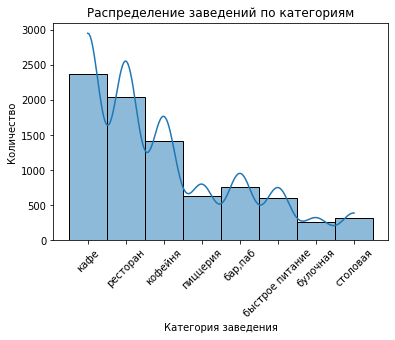

In [24]:
sns.histplot(x='category', data=data, kde=True)
plt.title('Распределение заведений по категориям')
plt.xlabel('Категория заведения')
plt.xticks(rotation=45)
plt.ylabel('Количество')
plt.show()

Видим, что больше всего заведений категории "кафе" и "ресторан" - в каждой категории более 2000 заведений.

На втором месте по количеству заведений - кофейни - их количество достигает почти 1500.

Далее в диапазоне от 600 до 700 заведений находятся категории "бар,паб", "пиццерия" и "быстрое питание".

И меньше всего заведений среди булочных и столовых - в районе 250-300.

Проверим количество посадочных мест в разрезе категорий

In [25]:
data_categories_seats = data.pivot_table(index='category', values=['name', 'seats'], aggfunc={'name': 'count', 'seats': 'sum'}, margins=True).sort_values(by='name', ascending=False).reset_index()
data_categories_seats = data_categories_seats.rename(columns={'name': 'count'})
data_categories_seats['avg_seats'] = round(data_categories_seats['seats']/data_categories['count'])
data_categories_seats = data_categories_seats.query('category != "All"')
data_categories_seats.sort_values(by='avg_seats', ascending=False)

,category,count,seats,avg_seats
2,ресторан,2043,154869.0,76.0
4,"бар,паб",765,58281.0,76.0
5,пиццерия,633,40350.0,64.0
3,кофейня,1413,83511.0,59.0
6,быстрое питание,603,34513.0,57.0
7,столовая,315,16359.0,52.0
8,булочная,256,13229.0,52.0
1,кафе,2378,118770.0,50.0


Видим, что среднее число посадочных мест в разрезе категорий преобладает в ресторанах и барах/пабах - 76 мест.
На втором месте - пиццерия - в среднем имеет 64 посадочных места.
На третьем месте кофейни, у них в среднем 59 посадочных мест.

Построим график и визуализируем распределение посадочных мест в разрезе категорий

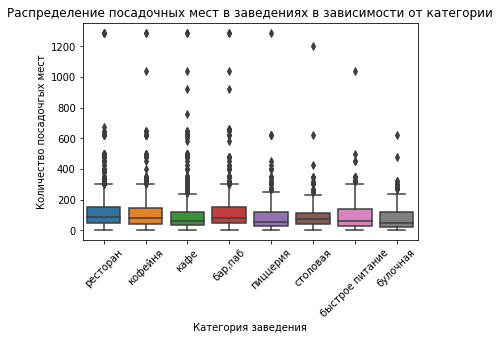

In [26]:
sns.boxplot(x='category', y='seats', data=data.sort_values(by='seats', ascending=False))
plt.title('Распределение посадочных мест в заведениях в зависимости от категории')
plt.xlabel('Категория заведения')
plt.xticks(rotation=45)
plt.ylabel('Количество посадочгых мест')
plt.show()

Видим, что в данном показателе есть аномальные значения - заведения с количеством мест более 1000.

Также видим, что медианное значение посадочных мест больше всего в заведениях категории "бар, паб", "ресторан" и "кофейня".

Рассмотрим соотношение сетевых и несетвых заведений

In [27]:
data_total_chain = data.pivot_table(index='chain', values='name', aggfunc='count', margins=True).reset_index()
data_total_chain['%'] = round(data_total_chain['name']/8406*100)
data_total_chain = data_total_chain.query('chain != "All"')
data_total_chain

,chain,name,%
0,0,5201,62.0
1,1,3205,38.0


In [28]:
fig = go.Figure(data=[go.Pie(labels=data_total_chain['chain'], values=data_total_chain['name'], pull = [0.1, 0])])
fig.update_layout(title='Соотношение сетевых(1) и несетевых(0) заведений в Москве',
                  width=800,
                  height=600,
                  annotations=[dict(x=1.12,
                                    y=1.05,
                                    text='Сетевое/Несетевое',
                                    showarrow=False)])
fig.show()

Сетевые заведения - 38% от общего количества

Несетевые заведения - 62% от общего количества

Рассмотрим сетевые и несетевые заведения в разрезе категорий

In [29]:
fig = px.histogram(data,
                   x='category',
                   color='chain',
                   title='Распределение количества заведений в зависимости от признака "Сетевое"/"Несетевое"',
                   barmode='overlay')
fig.update_xaxes(title_text='Категория заведения') 
fig.update_yaxes(title_text='Количество')
fig.show()

In [30]:
data_chain = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count', margins=True).sort_values(by='All', ascending=False)
data_chain = data_chain.rename(columns={0: 'not_chain', 1: 'chain'}).reset_index()
data_chain['not_chain, %'] = round(data_chain['not_chain']/data_chain['All']*100, 1)
data_chain['chain, %'] = round(data_chain['chain']/data_chain['All']*100, 1)
data_chain = data_chain.query('category != "All"')
data_chain.sort_values(by='All', ascending=False)

chain,category,not_chain,chain,All,"not_chain, %","chain, %"
1,кафе,1599,779,2378,67.2,32.8
2,ресторан,1313,730,2043,64.3,35.7
3,кофейня,693,720,1413,49.0,51.0
4,"бар,паб",596,169,765,77.9,22.1
5,пиццерия,303,330,633,47.9,52.1
6,быстрое питание,371,232,603,61.5,38.5
7,столовая,227,88,315,72.1,27.9
8,булочная,99,157,256,38.7,61.3


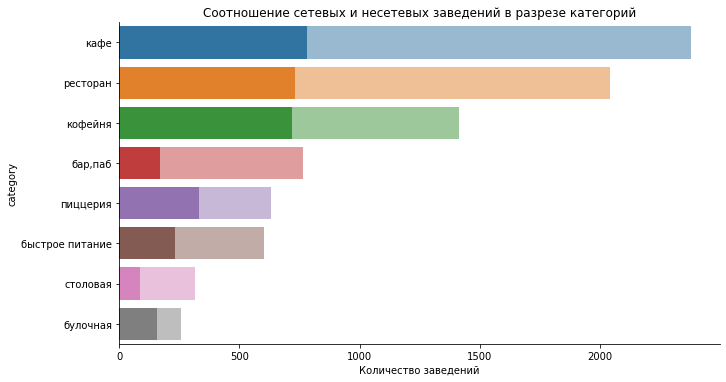

In [31]:
ax = sns.catplot(data=data_chain, 
                 kind="bar", 
                 x="chain", 
                 y="category",
                 alpha=1,
                 aspect=12/6)
ax1 = sns.barplot(x='All', y='category', data=data_chain, alpha=0.5,  orient='h')
ax.set_axis_labels('Количество заведений')
plt.title('Соотношение сетевых и несетевых заведений в разрезе категорий')
plt.show()

- соотношение сетевых и несетевых заведений практически равно среди пиццерий и кофеен
- значительно преобладает количество сетевых над несетевыми только среди булочных
- в категориях "рестораны" и "кафе" с самым большим количеством заведений больше преобладают несетевые заведения

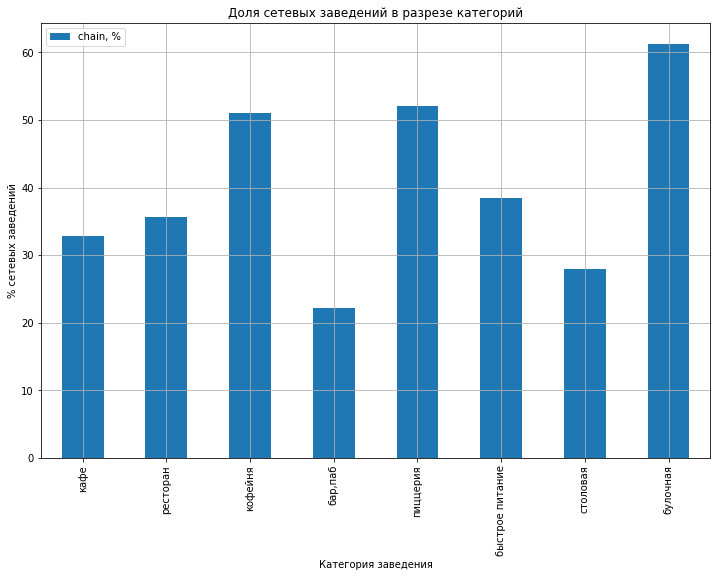

In [32]:
data_chain.plot(x='category', y='chain, %', grid=True, figsize=(12,8), kind='bar')
plt.title('Доля сетевых заведений в разрезе категорий')
plt.xlabel('Категория заведения')
plt.ylabel('% сетевых заведений')
plt.show()

На данном графике показаны проценты сетевых заведений в разрезе категорий.

Видим, что чаще всего сетевыми заведениями являются булочные, пиццерии и кофейни, а реже всего - бары/пабы.

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве.

In [33]:
data_top_chain = data.pivot_table(index=['name', 'category'], values='chain', aggfunc='sum').reset_index().sort_values(by='chain', ascending=False)
data_top_15_chain = data_top_chain.head(15)
data_top_15_chain

,name,category,chain
5870,шоколадница,кофейня,119
2713,домино'с пицца,пиццерия,76
2678,додо пицца,пиццерия,74
1202,one price coffee,кофейня,71
5946,яндекс лавка,ресторан,69
427,cofix,кофейня,65
1343,prime,ресторан,49
3415,кофепорт,кофейня,42
3479,кулинарная лавка братьев караваевых,кафе,39
5076,теремок,ресторан,36


In [34]:
name = ['шоколадница', 'домино`с пицца', 'додо пицца', 'one price coffee', 'яндекс лавка', 'cofix', 'prime', 'кофепорт', 'кулинарная лавка братьев караваевых', 'теремок', 'cofefest', 'чайхана', 'буханка', 'drive café', 'кофемания']
values = [119, 76, 74, 71, 69, 65, 49, 42, 39, 36, 31, 26, 25, 24, 22]

fig = go.Figure(data=[go.Pie(labels=name, values=values, pull = [0.1, 0])])
fig.update_layout(title='ТОП-15 сетевых заведений в Москве',
                  width=800,
                  height=600,
                  annotations=[dict(x=1.12,
                                    y=1.05,
                                    text='Наименование сети',
                                    showarrow=False)])
fig.show()

Сформировали ТОП-15 сетевых заведений Москвы.
На первом месте - Шоколадница, ее сеть в Москве составляет 119 заведений.
На втором и третьем - пиццерии домино`с пицца и додо пицца.

Большинство сетей нам знакомы и популярны не только в Москве, но и по всей стране.

Самой популярной категорией среди сетевых заведений является кофейня - из 15 заведений 6.

Рассмотрим, какие административные районы Москвы представлены к анализу.

Отобразим общее количество заведений и количество заведений в разрезе категорий по районам.

In [35]:
data_district=data.groupby(['district','category']).agg({'name':'count'})\
            .sort_values(by='name', ascending=False).reset_index()
data_district

,district,category,name
0,Центральный административный округ,ресторан,670
1,Центральный административный округ,кафе,464
2,Центральный административный округ,кофейня,428
3,Центральный административный округ,"бар,паб",364
4,Юго-Восточный административный округ,кафе,282
...,...,...,...
67,Северо-Западный административный округ,"бар,паб",23
68,Северо-Западный административный округ,столовая,18
69,Юго-Западный административный округ,столовая,17
70,Юго-Восточный административный округ,булочная,13


In [36]:
fig = px.bar(data_district, y='category', x='name', color='district', title='Разбивка категорий заведений по округам',
             text='name')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Видим, что большая часть всех заведений, в т.ч. и в разрезе категорий, расположена в Центральном административной округе.

Топ-3 округа по количеству заведений:

- Центральный административный округ
- Юго-Восточный административный округ
- Восточный административный округ

Самыми непопулярными являются Северо-Западный административный округ и Северный административный округ.

Можно обратить внимание, что кафе (за исключением Центрального административного округа и Северо-запаного административного округа) по количеству заведений в целом распределены в практически равном соотношении.

Также можно отметить, что количество кофеен в Центральном округе практически равно количеству кафе, несмотря на то, общее количество кофеен практически в 2 раза меньше, чем кафе.

Аналогичная ситуация и с барами/пабами по отношению к кофейням. В Центральном округе количество баров/пабов близко к количеству кофеен, в то время как их общее количество практически в 2 раза меньше. 

Рассмотрим рейтинги заведений общепита

In [37]:
data['rating'].describe()

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

Видим, что в данном столбце отсутствуют пропуски, а также нет выбросов и аномалий, поэтому возьмем для расчета усредненного рейтинга значение 'mean'

In [38]:
data_rating = data.pivot_table(index='category', values='rating', aggfunc='mean').reset_index().sort_values(by='rating', ascending=False)
data_rating['rating'] = round(data_rating['rating'], 1)
data_rating

,category,rating
0,"бар,паб",4.4
5,пиццерия,4.3
6,ресторан,4.3
4,кофейня,4.3
1,булочная,4.3
7,столовая,4.2
3,кафе,4.1
2,быстрое питание,4.1


In [39]:
fig = px.bar(data_rating, 
              x='category', 
              y='rating', 
              color='category',
              text='rating')

fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Категория заведения',
                   yaxis_title='Усредненный рейтинг')
fig.show()

Посмотрим, какое количество заведений Москвы имеют максимальный рейтинг и к каким категориям относятся

In [40]:
data_highrating = data.query('rating == 5.0')
data_highrating_pivot = data_highrating.pivot_table(index='category', values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)
data_highrating_pivot

,category,name
4,кофейня,37
3,кафе,30
6,ресторан,15
0,"бар,паб",7
5,пиццерия,7
2,быстрое питание,6
7,столовая,2
1,булочная,1


Несмотря на то, что по количеству заведений в Москве лидирует кафе, максимальное количество заведений с рейтингом 5.0 среди кофеен.

Средний рейтинг всех заведений Москвы не ниже 4.1 - это говорит о хорошем уровне в данной сфере.

Максимальный усредненный рейтинг среди заведений категории бар/паб - 4.4.

Также видим, что нет ни одной категории со средним рейтингом 4.5 и выше.

Построим фоновую картограмму (хороплет) с информацией о среднем рейтинге заведений каждого района

In [41]:
data_rating_geo = data.pivot_table(index='district', values='rating', aggfunc='mean').reset_index().sort_values(by='rating', ascending=False)
data_rating_geo['rating'] = data_rating_geo['rating'].round(1)
data_rating_geo

,district,rating
5,Центральный административный округ,4.4
2,Северный административный округ,4.2
4,Северо-Западный административный округ,4.2
8,Южный административный округ,4.2
1,Западный административный округ,4.2
0,Восточный административный округ,4.2
7,Юго-Западный административный округ,4.2
3,Северо-Восточный административный округ,4.1
6,Юго-Восточный административный округ,4.1


In [42]:
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

print(json.dumps(geo_json, indent=2, ensure_ascii=False, sort_keys=True))

{
  "features": [
    {
      "geometry": {
        "coordinates": [
          [
            [
              [
                37.8756653,
                55.825342400000004
              ],
              [
                37.876001599999995,
                55.8249027
              ],
              [
                37.8730967,
                55.8237936
              ],
              [
                37.8689418,
                55.8228697
              ],
              [
                37.869206999999996,
                55.822363200000005
              ],
              [
                37.868322500000005,
                55.822211100000004
              ],
              [
                37.867472,
                55.823703
              ],
              [
                37.86851090000001,
                55.82391880000001
              ],
              [
                37.87046039999999,
                55.8242706
              ],
              [
                37.87172779999

In [43]:
data_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=data_geo,
    data=data_rating_geo,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

Видим, что заведения с самым высоким средним рейтингом 4.4 расположены в Центральном административном округе Москвы.

Самыe низкиe рейтинги - 4.1 - в Юго-Восточном и Северо-Восточном округах.

В остальных округах средний рейтинг заведений составляет 4.2.

In [44]:
data_rating_category_geo = data.pivot_table(index='category', values='rating', aggfunc='mean').reset_index().sort_values(by='rating', ascending=False)
data_rating_category_geo['rating'] = data_rating_category_geo['rating'].round(1)
data_rating_category_geo

,category,rating
0,"бар,паб",4.4
5,пиццерия,4.3
6,ресторан,4.3
4,кофейня,4.3
1,булочная,4.3
7,столовая,4.2
3,кафе,4.1
2,быстрое питание,4.1


In [45]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

data.apply(create_clusters, axis=1)

m

На данной карте отобразили количество заведений в разрезе округов

Далее рассмотрим заведения

In [46]:
fig = px.bar(data_district, y='category', x='name', color='district', title='Разбивка категорий заведений по округам',
             text='name')
fig.update_layout(yaxis={'categoryorder':'total ascending'})
fig.show()

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий в разрезе улиц.

In [47]:
data_street = data.pivot_table(index=['street'], values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)
data_street = data_street.head(15)
data_street

,street,name
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


Видим, что больше всего заведений расположено на проспекте Мира, на Профсоюзной улице, а также на проспекте Вернадского и Ленинском проспекте.

Посмотрим на распределение количества заведений в разрезе категорий.

In [48]:
data_street_category = data.pivot_table(index=['street','category'], values='name', aggfunc='count').reset_index()
data_street_category = data_street_category.query('street in ["проспект Мира", "Профсоюзная улица", "проспект Вернадского", "Ленинский проспект", "Ленинградский проспект", "Дмитровское шоссе", "Каширское шоссе", "Варшавское шоссе", "Ленинградское шоссе", "МКАД", "Люблинская улица", "улица Вавилова", "Кутузовский проспект", "улица Миклухо-Маклая", "Пятницкая улица"]')
data_street_category

,street,category,name
683,Варшавское шоссе,"бар,паб",6
684,Варшавское шоссе,быстрое питание,7
685,Варшавское шоссе,кафе,18
686,Варшавское шоссе,кофейня,14
687,Варшавское шоссе,пиццерия,4
...,...,...,...
3434,улица Миклухо-Маклая,быстрое питание,4
3435,улица Миклухо-Маклая,кафе,21
3436,улица Миклухо-Маклая,кофейня,4
3437,улица Миклухо-Маклая,пиццерия,2


In [49]:
fig = px.bar(data_street_category, y='street', x='name', color='category', title='Распределение количества заведений в разрезе категорий и улиц',
             text='name')
fig.update_layout(yaxis={'categoryorder': 'total ascending'})
fig.show()

Исходя из распределения количества заведений по улицам в разрезе категорий, видим, что по количеству среди заведений на топ-15 улицах преобладают кафе, на втором месте - рестораны, и на третьем - кофейни.

Рассмотрим, в каких районах находятся улицы с самым высоким количеством заведений

In [50]:
data_street_district = data.pivot_table(index=['street','district'], values='name', aggfunc='count').reset_index()
data_street_district = data_street_district.query('street in ["проспект Мира", "Профсоюзная улица", "проспект Вернадского", "Ленинский проспект", "Ленинградский проспект", "Дмитровское шоссе", "Каширское шоссе", "Варшавское шоссе", "Ленинградское шоссе", "МКАД", "Люблинская улица", "улица Вавилова", "Кутузовский проспект", "улица Миклухо-Маклая", "Пятницкая улица"]')
data_street_district

,street,district,name
304,Варшавское шоссе,Южный административный округ,76
382,Дмитровское шоссе,Северный административный округ,65
383,Дмитровское шоссе,Северо-Восточный административный округ,23
468,Каширское шоссе,Южный административный округ,77
532,Кутузовский проспект,Западный административный округ,54
538,Ленинградский проспект,Северный административный округ,95
539,Ленинградское шоссе,Северный административный округ,70
540,Ленинский проспект,Западный административный округ,21
541,Ленинский проспект,Центральный административный округ,8
542,Ленинский проспект,Юго-Западный административный округ,66


In [51]:
fig = px.bar(data_street_district, y='street', x='name', color='district', title='Распределение количества заведений в разрезе районов и улиц',
             text='name')
fig.update_layout(yaxis={'categoryorder': 'total ascending'})
fig.show()

Видим, что часть улиц находится сразу в нескольких административных округах одновременно, т.е., вероятно, переходит из одного в другой.

- проспект Мира - с самым высоким количеством заведений - находится в Северо-Восточном и Центральном административных округых.

- улица Профсоюзная - в Юго-Западном административном округе.

- проспект Вернадского - в Западном и Юго-Западном административных округах.

В целом видим, что нет какой-либо четкой зависимости топ-15 улиц к одному или двум районам, они распределены по всем районам Москвы.





Далее рассмотрим улицы, на которых находится только одно заведение.

In [52]:
data_street_one = data.pivot_table(index=['street'], values='name', aggfunc='count').reset_index().sort_values(by='name')
data_street_one = data_street_one.query('name == 1')
data_street_one

,street,name
0,1-й Автозаводский проезд,1
683,Одинцовская улица,1
689,Октябрьский переулок,1
694,Ордынский тупик,1
695,Оренбургская улица,1
...,...,...
124,3-й Хорошёвский проезд,1
217,Бобров переулок,1
218,Богословский переулок,1
138,4-й Лесной переулок,1


In [53]:
print(round(len(data_street_one)/data['street'].nunique(), 2))

0.32


Видим, что таких улиц довольно много - 458 - что составляет 32% от общего количества улиц

Рассмотрим эти улицы более подробно

In [54]:
df_one_street = data[data['street'].isin(data_street_one['street'].to_list())]

In [55]:
df_one_street_rating = df_one_street.pivot_table(index='rating', values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)
df_one_street_rating.head(5)

,rating,name
19,4.3,84
20,4.4,56
18,4.2,54
17,4.1,49
23,4.7,28


In [56]:
df_one_street_district = df_one_street.pivot_table(index='district', values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)
df_one_street_district

,district,name
5,Центральный административный округ,145
3,Северо-Восточный административный округ,55
0,Восточный административный округ,52
2,Северный административный округ,52
8,Южный административный округ,43
6,Юго-Восточный административный округ,39
1,Западный административный округ,35
4,Северо-Западный административный округ,19
7,Юго-Западный административный округ,18


In [57]:
fig = px.bar(df_one_street_district, y='district', x='name', color='district', title='Распределение количества улиц с одним заведением в разрезе районов',
             text='name')
fig.update_layout(yaxis={'categoryorder': 'total ascending'})
fig.show()

In [58]:
df_one_street_district_2 = df_one_street.pivot_table(index='district', values='rating', aggfunc='median').reset_index().sort_values(by='rating', ascending=False)
df_one_street_district_2

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
6,Юго-Восточный административный округ,4.3
1,Западный административный округ,4.2
3,Северо-Восточный административный округ,4.2
8,Южный административный округ,4.2
7,Юго-Западный административный округ,4.1


In [59]:
fig = px.bar(df_one_street_district_2, y='district', x='rating', color='district', title='Распределение рейтинга заведений, расположенных на улицах с одним заведением в разрезе районов',
             text='rating')
fig.update_layout(yaxis={'categoryorder': 'total ascending'})
fig.show()

- Количество улиц с одним заведением составляет 32% от общего числа улиц
- Большая часть таких улиц расположена в Центрально административном округе
- Большее число таких заведений имеют рейтинг 4.3
- Самый высокий средний рейтинг у заведений с таким расположением в Центральном административном округе - 4.4

In [60]:
data_avg_bill = data.pivot_table(index='district', values='middle_avg_bill', aggfunc='median').reset_index().sort_values(by='middle_avg_bill', ascending=False)
data_avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [61]:
data_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=data_geo,
    data=data_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

m

Итак, видим, что самый высокий средний чек в центральном и западном районах, составляет 1000 руб.

Юго-Западный административный округ, Северный административный округ, Северо-Западный административный округ можно отнести к средней категории - их средний чек варьируется от 600 до 700 руб.	

Видим прямую зависимость цен в заведениях Москвы от их расположения: чем ближе к центру, тем выше средний чек.

Более доступные заведения находятся в южных и восточных районах города.

Дополнительно рассмотрим средние чеки в разрезе категорий заведений и в зависимости от рейтинга

In [62]:
data_avg_bill_category = data.pivot_table(index='category', values='middle_avg_bill', aggfunc='median').reset_index().sort_values(by='middle_avg_bill', ascending=False)
data_avg_bill_category

,category,middle_avg_bill
0,"бар,паб",1250.0
6,ресторан,1250.0
5,пиццерия,600.0
3,кафе,550.0
1,булочная,450.0
4,кофейня,400.0
2,быстрое питание,375.0
7,столовая,300.0


In [63]:
fig = px.bar(data_avg_bill_category, y='middle_avg_bill', x='category',  title='Средний чек в заведениях в разрезе категорий',
             text='middle_avg_bill')
fig.update_layout(yaxis={'categoryorder': 'total ascending'})
fig.show()

Видим, что максимальный средний чек в барах,пабах и ресторанах, минимальный - в заведениях быстрого питания и столовых.

In [64]:
data_avg_bill_rating = data.pivot_table(index='rating', values='middle_avg_bill', aggfunc='median').reset_index().sort_values(by='rating', ascending=False)
data_avg_bill_rating

,rating,middle_avg_bill
32,5.0,500.0
31,4.9,1175.0
30,4.8,1000.0
29,4.7,1150.0
28,4.6,1050.0
27,4.5,1250.0
26,4.4,1000.0
25,4.3,750.0
24,4.2,500.0
23,4.1,500.0


In [65]:
fig = px.bar(data_avg_bill_rating, y='middle_avg_bill', x='rating',  title='Средний чек в заведениях в разрезе рейтинга',
             text='middle_avg_bill')
fig.update_layout(yaxis={'categoryorder': 'total ascending'})
fig.show()

Видим, что самый низкий рейтинг у заведений с самым высоким средним чеком.

Больше всего люди довольны заведениями со средним чеком от 500 руб. до 1250 руб. (оценки 4.5-5)

# Вывод

Итак, мы провели анализ показателей анализ категорий заведений, количества посадочных мест, сетевых и несетевых заведений, рейтинга и среднего чека, а также посмотрели информацию о заведениях в разрезе районов Москвы.

На основании проведенного анализа можно сделать следующие выводы:
    
1. Категории заведений общественного питания:
    - Кафе является самым распространенным видом заведения - 28% объектов общественного питания относятся к данной категории
    - На втором, третьем и четвертом месте по количеству находятся такие категории заведений, как: ресторан (24%), кофейни (17%), бары,пабы (9%)
    - Меньше всего по количеству заведений среди столовых и булочных
    - Больше всего посадочных мест имеют рестораны и бары,пабы - в среднем это 76 мест.
    
2. Сетевые и несетевые заведения:
    - На более чем 50% сетевыми заведениями являются булочные (61%), пиццерии (52%) и кофейни (51%)
    - Меньше всего сетевых заведений среди баров,пабов и столовых
    - Несмотря на то, что в процентном соотношении сетевые заведения среди кафе и ресторанов достаточно низкие (33% и 36% соответственно), в количественном соотношении наличия сетевых заведений данные категории лидируют: кафе - 779 шт., рестораны - 730 шт.)
    - Самыми популярными среди сетевых заведений в Москве являются Шоколадница, Домино'с пицца, ДоДо Пицца, One Price Coffee.
    
3. Местоположение заведений общественного питания:
    - Центральный административный округ является лидером по количеству заведений
    - Кафе является самым распространенным заведением в каждом из округов, кроме Центрального
    - В Центральном округе самым распространенным заведением являются рестораны
    - Среди топ-15 улиц по количеству заведений более популярны кафе, рстораны и кофейни
    
4. Рейтинги заведений общественного питания в Москве:
    - Максимальный средний рейтинг имет заведения категории бар,паб - 4.4
    - Минимальный средний рейтинг заведений Москвы составляет 4.1 (кафе, быстрое питание)
    - Рейтинг 5.0 чаще всего встречает у кофеен
    - Самые высокие рейтинги у заведений, расположенных в Центральном административном округе - 4.4
    - Самые низкие рейтинги у заведений, расположенных в Северо- и Юго-Восточном административных округах - 4.1
    
5. Средний чек:
    - Самый высокий средний чек в Центральном и Западном округах - составляет 1000 руб.
    - Минимальный средний чек в Южном и Юго-Восточном округах - 500 руб. и 450 руб. соответственно.
    - Максимальный средний чек в барах,пабах и ресторанах - 1250 руб, а минимальный - в столовых.
    - В разрезе рейтинга самая низкая оценка у заведений со средним чеком в районе 4500 руб., самая высокая - со средним чеком 500 руб.

# Детализация исследования: открытие кофейни

Рассмотрим, сколько всего кофеен в таблице и в каких районах они находятся

In [66]:
data_coffee = data.query('category == "кофейня"')
data_coffee.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1413 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   int64  
 13  seats              751 non-null    float64
 14  street             1413 non-null   object 
 15  is_24/7            1413 non-null   bool   
dtypes: bool(1), float64(6), 

In [67]:
data_coffee_disrict = data_coffee.pivot_table(index='district', values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)
data_coffee_disrict

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [68]:
fig = go.Figure(data=[go.Pie(labels=data_coffee_disrict['district'], 
                             values=data_coffee_disrict['name'], 
                             pull = [0.1, 0])]) 
fig.update_layout(title='Количество кофеен по районам', 
                  width=800,
                  height=600,
                  annotations=[dict(x=1.12,
                                    y=1.05,
                                    text='Количество кофеен',
                                    showarrow=False)])
fig.show()

Всего в датасете 1413 кофеен.

По количеству кофеен лидирует Центральный административный округ - 30.3%.

На втором, третьем и четвертом месте по количеству кофеен Северный (13.7%), Северо-Восточный (11.3%) и Западный (10.6%) районы соответственно.

Рассмотрим, есть ли круглосуточные кофейни.

In [69]:
data_coffee_24 = data_coffee.pivot_table(index='category', columns='is_24/7', values='name', aggfunc='count', margins=True).reset_index()
data_coffee_24['False, %'] = round(data_coffee_24[False]/1413*100, 1)
data_coffee_24['True, %'] = round(data_coffee_24[True]/1413*100, 1)
data_coffee_24 = data_coffee_24.query('category == "кофейня"')
data_coffee_24

is_24/7,category,False,True,All,"False, %","True, %"
0,кофейня,1354,59,1413,95.8,4.2


Есть круглосуточные кофейни, но их достаточно мало в соотношении с общим количеством.

Рассмотрим рейтинги кофеен и их распределение по районам

In [70]:
data_coffee['rating'].describe()

count    1413.000000
mean        4.277282
std         0.372250
min         1.400000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

In [71]:
data_coffee_rating = data_coffee.pivot_table(index='rating', values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)
data_coffee_rating

,rating,name
20,4.3,261
21,4.4,228
19,4.2,202
18,4.1,170
22,4.5,95
17,4.0,78
24,4.7,77
23,4.6,61
16,3.9,38
27,5.0,37


In [72]:
fig = px.bar(data_coffee_rating, y='name', x='rating', color='rating',  title='Количество кофеен в разрезе рейтинга',
             text='name')
fig.show()

In [73]:
data_coffee_rating_2 = data_coffee.pivot_table(index='rating', columns='is_24/7', values='name', aggfunc='count', margins=True).reset_index().sort_values(by='All', ascending=False)
data_coffee_rating_2 = data_coffee_rating_2[data_coffee_rating_2['rating'] != 'All']
data_coffee_rating_2

is_24/7,rating,False,True,All
20,4.3,250.0,11.0,261
21,4.4,223.0,5.0,228
19,4.2,186.0,16.0,202
18,4.1,164.0,6.0,170
22,4.5,90.0,5.0,95
17,4.0,72.0,6.0,78
24,4.7,75.0,2.0,77
23,4.6,61.0,NaN,61
16,3.9,38.0,NaN,38
27,5.0,36.0,1.0,37


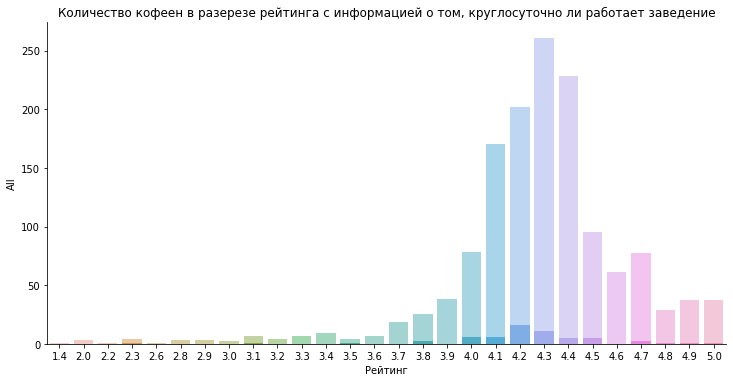

In [74]:
ax = sns.catplot(data=data_coffee_rating_2, 
                 kind="bar", 
                 x='rating', 
                 y=True,
                 alpha=1,
                 aspect=12/6)
ax1 = sns.barplot(x='rating', y='All', data=data_coffee_rating_2, alpha=0.5)
ax.set_axis_labels('Рейтинг')
plt.title('Количество кофеен в разерезе рейтинга с информацией о том, круглосуточно ли работает заведение')
plt.show()

- Большинство кофеен имеют рейтинг от 4 до 4.7
- Максимальное количество кофеен с рейтингом 4.3
- Средний рейтинг кофеен близится к 4.3
- Большинство круглосуточных кофеен имеют рейтинг 4.2

In [75]:
data_coffee_district = data_coffee.pivot_table(index='district', values='name', aggfunc='count').reset_index().sort_values(by='name', ascending=False)
data_coffee_district

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [76]:
fig = px.bar(data_coffee_district, y='name', x='district', color='district',  title='Количество кофеен в разрезе районов',
             text='name')
fig.show()

In [77]:
data_coffee_district_2 = data_coffee.pivot_table(index='district', columns='is_24/7', values='name', aggfunc='count', margins=True).reset_index().sort_values(by='All', ascending=False)
data_coffee_district_2 = data_coffee_district_2[data_coffee_district_2['district'] != 'All']
data_coffee_district_2

is_24/7,district,False,True,All
5,Центральный административный округ,402,26,428
2,Северный административный округ,188,5,193
3,Северо-Восточный административный округ,156,3,159
1,Западный административный округ,141,9,150
8,Южный административный округ,130,1,131
0,Восточный административный округ,100,5,105
7,Юго-Западный административный округ,89,7,96
6,Юго-Восточный административный округ,88,1,89
4,Северо-Западный административный округ,60,2,62


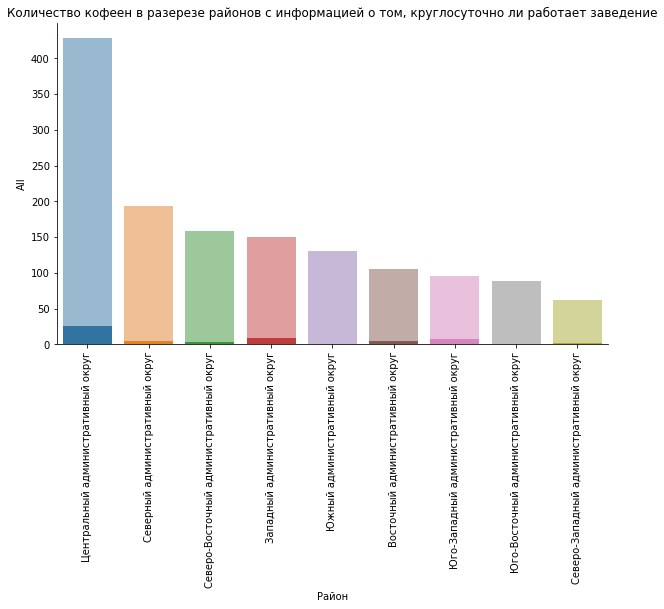

In [78]:
ax = sns.catplot(data=data_coffee_district_2, 
                 kind="bar", 
                 x='district', 
                 y=True,
                 alpha=1,
                 aspect=12/6)
ax1 = sns.barplot(x='district', y='All', data=data_coffee_district_2, alpha=0.5)
ax.set_axis_labels('Район')
plt.title('Количество кофеен в разерезе районов с информацией о том, круглосуточно ли работает заведение')
plt.xticks(rotation='90')
plt.show()

- Большинство кофеен расположено в Центральном административном округе
- Разница по количеству кофеен между Центральным (первый в рейтинге) и Северным (второй в рейтинге) округами больше чем в 2 раза
- Больше всего круглосуточных кофеен расположено в Центральном административном округе

Рассмотрим информацию о средней стоимости чашки

In [79]:
data_coffee_avg_bill = data.pivot_table(index='district', values='middle_coffee_cup', aggfunc='median').reset_index().sort_values(by='middle_coffee_cup', ascending=False)
data_coffee_avg_bill

,district,middle_coffee_cup
7,Юго-Западный административный округ,197.0
5,Центральный административный округ,190.0
1,Западный административный округ,187.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
4,Северо-Западный административный округ,150.0
8,Южный административный округ,149.5
6,Юго-Восточный административный округ,145.0
0,Восточный административный округ,135.0


In [80]:
data_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=data_geo,
    data=data_coffee_avg_bill,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя стоимость одной чашки капучино в кофейнях в разрезе районов',
).add_to(m)

m

Средняя стоимость чашки капучино варьируется в диапазоне от 135 руб. до 197 руб. в разрезе районов.

Самый дешевый капучино будет в Восточном административном округе за 135 руб.

Самый дорогой - в Юго-Западном административном округе за 197 руб.

Рассмотрим среднюю стоимость капучино в кофейнях так же в разрезе районов, но с детализацией по рейтингам.

In [81]:
data_coffee_avg_bill_rating = data.pivot_table(index=['district', 'rating'], values='middle_coffee_cup', aggfunc='median').reset_index().sort_values(by='middle_coffee_cup', ascending=False)
data_coffee_avg_bill_rating

,district,rating,middle_coffee_cup
23,Западный административный округ,4.8,270.0
14,Западный административный округ,3.7,270.0
42,Северо-Восточный административный округ,4.1,256.0
18,Западный административный округ,4.1,250.0
89,Юго-Западный административный округ,4.2,240.0
...,...,...,...
4,Восточный административный округ,4.1,80.0
0,Восточный административный округ,3.1,80.0
2,Восточный административный округ,3.6,79.0
27,Северный административный округ,3.9,77.5


In [82]:
fig = px.bar(data_coffee_avg_bill_rating, y='district', x='middle_coffee_cup', color='rating', title='Зависимость средней стоимости чашки капучино от рейтинга в разрезе районов',
             text='middle_coffee_cup')
fig.update_layout(yaxis={'categoryorder': 'total ascending'})
fig.show()

Видим, что, например, в Западном административном округе цены на кофе значительно выше, но рейтинг у большинства заведений ниже 4.

В то время как в Центральном административном округе цены незначительно, но ниже, и рейтинг у заведений гораздо выше.

Исходя из данной информации, ориентироваться на стоимость чашки капучино при открытии кофейни предлагаем на среднюю стоимость капучино в выбранном для проекта районе. Для начала можно попробовать сделать стоимость на 10%-15% ниже средней рыночной для полноценного знакомства посетителей с вашей кофейней. 

# Вывод

- Общее количество кофеен в датасете составляет 1413 заведений - 16.8% от общего количества
- Большая часть расположена в Центральном административном округе - 30% от общего количества
- Средний рейтинг кофеен - 4.3
- Средняя стоимость чашки капучино варьируется в диапазоне от 135 руб. до 197 руб. в разрезе районов.
- Самый дешевый капучино будет в Восточном административном округе за 135 руб.
- Самый дорогой - в Юго-Западном административном округе за 197 руб.

# Общий вывод и рекомендации

# Вывод:

    
1. Категории заведений общественного питания:
    - Кафе является самым распространенным видом заведения - 28% объектов общественного питания относятся к данной категории
    - На втором, третьем и четвертом месте по количеству находятся такие категории заведений, как: ресторан (24%), кофейни (17%), бары,пабы (9%)
    - Меньше всего по количеству заведений среди столовых и булочных
    - Больше всего посадочных мест имеют рестораны и бары,пабы - в среднем это 76 мест.
    
2. Сетевые и несетевые заведения:
    - На более чем 50% сетевыми заведениями являются булочные (61%), пиццерии (52%) и кофейни (51%)
    - Меньше всего сетевых заведений среди баров,пабов и столовых
    - Несмотря на то, что в процентном соотношении сетевые заведения среди кафе и ресторанов достаточно низкие (33% и 36% соответственно), в количественном соотношении наличия сетевых заведений данные категории лидируют: кафе - 779 шт., рестораны - 730 шт.)
    - Самыми популярными среди сетевых заведений в Москве являются Шоколадница, Домино'с пицца, ДоДо Пицца, One Price Coffee.
    
3. Местоположение заведений общественного питания:
    - Центральный административный округ является лидером по количеству заведений
    - Кафе является самым распространенным заведением в каждом из округов, кроме Центрального
    - В Центральном округе самым распространенным заведением являются рестораны
    - Среди топ-15 улиц по количеству заведений более популярны кафе, рстораны и кофейни
    - 32% улиц имеют одно заведение и основная часть этих улиц находится в центральном округе
    
4. Рейтинги заведений общественного питания в Москве:
    - Максимальный средний рейтинг имет заведения категории бар,паб - 4.4
    - Минимальный средний рейтинг заведений Москвы составляет 4.1 (кафе, быстрое питание)
    - Рейтинг 5.0 чаще всего встречает у кофеен
    - Самые высокие рейтинги у заведений, расположенных в Центральном административном округе - 4.4
    - Самые низкие рейтинги у заведений, расположенных в Северо- и Юго-Восточном административных округах - 4.1
    
5. Средний чек:
    - Самый высокий средний чек в Центральном и Западном округах - составляет 1000 руб.
    - Минимальный средний чек в Южном и Юго-Восточном округах - 500 руб. и 450 руб. соответственно.
    - Максимальный средний чек в барах,пабах и ресторанах - 1250 руб, а минимальный - в столовых.
    - В разрезе рейтинга самая низкая оценка у заведений со средним чеком в районе 4500 руб., самая высокая - со средним чеком 500 руб.
    
6. Кофейни:
    - Общее количество кофеен в датасете составляет 1413 заведений - 16.8% от общего количества
    - Большая часть расположена в Центральном административном округе - 30% от общего количества
    - Средний рейтинг кофеен - 4.3
    - Средняя стоимость чашки капучино варьируется в диапазоне от 135 руб. до 197 руб. в разрезе районов.
    - Самый дешевый капучино будет в Восточном административном округе за 135 руб.
    - Самый дорогой - в Юго-Западном административном округе за 197 руб.

# Рекомендации:



1) На основании исследования в целом можно сказать, что самым распространенным заведением является кафе, и в качестве рекомендации хотелось бы выделить данную категорию заведения.

2) Для расположения заведения стоит рассмотреть Центральный Административный Округ - он сможет обеспечить высокую проходимость жителей и туристов, а также постоянный поток клиентов. Оптимальное количество посадочных мест для кафе - до 50.

3) Также среди кафе, несмотря на то, что они являются самыми популярными заведениями, достаточно низкий средний рейтинг (4.1) по сравнению с другими категориями, что говорит о недостаточной удовлетворенности посетителями данной категорией заведений общественного питания. Это может стать возможностью для открытия чего-то нового, необычного и с качественным сервисом.

4) Если в качестве рекомендации рассматривать возможность исполнить мечту заказчика в части открытия кофейни, тогда стоит рассмотреть либо Центральный административный округ как место с высокой прходимостью и большим количеством посетителей, либо Западный административный округ как тоже достаточно популярный район, но имеющий низкий средний рейтинг среди заведений. Здесь можно открыть что-то интересное с необычной концепцией и качественным сервисом для привлечения и дальнейшего удержания посетителей.

# Презентация

Презентация: https://disk.yandex.ru/i/Ehw-nSJabdn8bQ